In [1]:
!wget https://data.deepai.org/PascalVOC2012.zip
!unzip PascalVOC2012.zip
!mv voc2012 VOCdevkit
!pip install segmentation_models_pytorch
!python -m pip install pytorch-lightning
!git clone -b autumn_2023 https://github.com/AlekseySpasenov/dl-course.git

--2023-10-29 23:04:47--  https://data.deepai.org/PascalVOC2012.zip
Resolving data.deepai.org (data.deepai.org)... 169.150.249.163, 2400:52e0:1a01::995:1
Connecting to data.deepai.org (data.deepai.org)|169.150.249.163|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3899239928 (3.6G) [application/zip]
Saving to: ‘PascalVOC2012.zip’

PascalVOC2012.zip     2%[                    ] 102.92M  5.05MB/s    eta 11m 48s^C
Archive:  PascalVOC2012.zip
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
unzip:  cannot find zipfile directory in one of PascalVOC2012.zip or
        PascalVOC2012.zip.zip, and cannot find PascalVOC2012.zip.ZIP, period.
mv: cannot stat 'voc2012': No such file or directory
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 2.1 MB/s eta 0:

In [ ]:

#!wget https://disk.yandex.ru/d/cK1PQ1-nn3PbKg
#!unzip

In [ ]:
"""
import os
from zipfile import ZipFile
if not os.path.exists("checkpoints.zip"):
    raise FileNotFoundError("Скачайте архив с обученными моделями")

with ZipFile("checkpoints.zip", "r") as zf:
    zf.extractall(".")"""

'\nimport os\nfrom zipfile import ZipFile\nif not os.path.exists("checkpoints.zip"):\n    raise FileNotFoundError("Скачайте архив с обученными моделями")\n\nwith ZipFile("checkpoints.zip", "r") as zf:\n    zf.extractall(".")'

In [ ]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import random

import cv2
import torch
import torchvision
import numpy as np
import pytorch_lightning as pl
import segmentation_models_pytorch as smp
from matplotlib import pyplot as plt
from PIL import Image
from torchvision.datasets import VOCSegmentation

import sys
sys.path.append("dl-course/lecture7")

import cvmade
import seminar

# Реализация аугментаций с соответствующего семинара.
from augmentations import AffineAugmenter, BrightnessContrastAugmenter, BlurAugmenter, FlipAugmenter, RandomAugmentation

print("Torch", torch.__version__)

USE_CUDA = torch.cuda.is_available()
if USE_CUDA:
    DEVICE="cuda"
    print("Use CUDA")
else:
    DEVICE="cpu"

# Параметры тренировки и визуализации.
TRAIN = True  # Если False, будут использоваться заранее посчитанные графики
              # вместо реальной тренировки (полезно для демонстрации на ноутбуках без GPU).

def set_figure_size(figsize=(8, 6), dpi=120):
    plt.figure(figsize=figsize, dpi=dpi)


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Torch 2.1.0+cu118
Use CUDA


In [ ]:
DATA_ROOT = "."
VOC_YEAR = "2012"
LABELS = ["background", "aeroplane", "bicycle", "bird", "boat", "bottle",
          "bus", "car", "cat", "chair", "cow", "diningtable", "dog", "horse",
          "motorbike", "person", "potted_plant", "sheep", "sofa", "train", "tv/monitor"]
MULTICLASS = False  # Если False, отделяем объекты от фона, иначе распознаем класс объектов.
NUM_CLASSES = len(LABELS) if MULTICLASS else 2
print("Number of classes:", NUM_CLASSES)

Number of classes: 2


Mask values: {0, 9, 11, 18, 255}


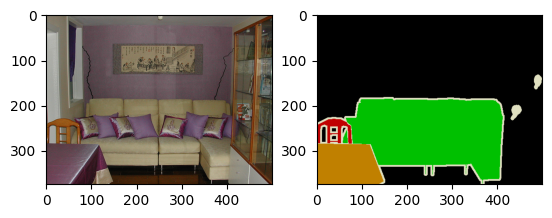

In [ ]:
# Посмотрим на валидационную часть корпуса.
valset_raw = VOCSegmentation(DATA_ROOT, VOC_YEAR, "val", download=False)

image, mask = valset_raw[random.randint(0, len(valset_raw) - 1)]
print("Mask values:", set(np.array(mask).flatten().tolist()))

fig, axs = plt.subplots(1, 2)
axs[0].imshow(image)
axs[1].imshow(mask)
plt.show()

In [ ]:
class Scaler(object):
    """Отмасштабировать изображения сохранив пропорции.

    Пустые места будут заполнены отражениями.

    Аргументы:
        image: Изображение в HWC формате.
        size: Требуемый размер, пара W, H.
    """
    def __init__(self, size):
        self._size = size
        self._padding = 0

    def set_padding(self, padding):
        self._padding = padding

    def __call__(self, image):
        if not isinstance(image, np.ndarray):
            image = np.array(image)
        grayscale = (len(image.shape) == 2)
        if grayscale:
            image = image[..., None]
        rw, rh = self._size
        p = self._padding
        h, w, c = image.shape
        scale_x = rw / w
        scale_y = rh / h
        scale = min(scale_x, scale_y)
        sw = int(scale * w)
        sh = int(scale * h)
        offset_x = p + (rw - sw) // 2
        offset_y = p + (rh - sh) // 2
        # Используем zeros на случай маленьких изображений.
        result = np.zeros((rh + 2 * p, rw + 2 * p, c), dtype=image.dtype)
        cv2.resize(image, (sw, sh),
                   interpolation=cv2.INTER_NEAREST if grayscale else cv2.INTER_AREA,
                   dst=result[offset_y:offset_y + sh, offset_x:offset_x + sw])

        # Отразить.
        result[offset_y:offset_y + sh, :offset_x] = result[offset_y:offset_y + sh, offset_x:2 * offset_x][:, ::-1]
        offset_end = result.shape[1] - offset_x - sw
        result[offset_y:offset_y + sh, offset_x + sw:] = result[offset_y:offset_y + sh, sw + offset_x - offset_end:sw + offset_x][:, ::-1]

        result[:offset_y] = result[offset_y:2 * offset_y][::-1]
        offset_end = result.shape[0] - offset_y - sh
        result[offset_y + sh:] = result[sh + offset_y - offset_end:sh + offset_y][::-1]

        if grayscale:
            result = result[:, :, 0]
        return result


def remove_borders_inplace(mask):
    mask[mask == 255] = 0
    return mask


In [ ]:
base_augment = (
    AffineAugmenter(),
    BrightnessContrastAugmenter(),
    BlurAugmenter(),
    FlipAugmenter(),
)


In [ ]:
class VOCDataset(torch.utils.data.Dataset):
    """Обертка для стандартного класса, которая форматирует данные."""
    def __init__(self, root, year, image_size,
                 multiclass=MULTICLASS,
                 download=False, augment=False,
                 train=False, train_fraction=0.8,
                 padding=0,
                 augmentations=(AffineAugmenter(),)):
        """Создать корпус.

        Аргументы:
            root: Путь до папки для хранения данных.
            year: 2007 или 2012.
            image_size: Ширина и высота изображений.
            download: Скачать корпус, если он не найден в папке.
            augment: Применить аугментации.
            train: Выделить train часть, иначе validation.
            train_fraction: Доля тренировочных примеров.
            padding: Добавить дополнительный зеркальынй паддинг к изображению.
        """
        self._dataset = VOCSegmentation(root, str(year), "trainval", download=download)
        self._image_size = np.array(image_size)
        self._multiclass = multiclass
        self._padding = padding

        ids = list(range(len(self._dataset)))
        random.seed(0)
        random.shuffle(ids)
        train_size = int(len(ids) * train_fraction)
        self._indices = ids[:train_size] if train else ids[train_size:]

        self._image_scaler = Scaler(image_size)
        self._mask_scaler = Scaler(image_size)
        if augment:
            self._augmenter = RandomAugmentation(*augmentations)
        else:
            self._augmenter = lambda image, mask: (image, mask)

    @property
    def image_size(self):
        return self._image_size + self._padding * 2

    def set_padding(self, padding):
        self._padding = padding
        self._image_scaler.set_padding(padding)
        self._mask_scaler.set_padding(padding)

    def __len__(self):
        return len(self._indices)

    def __getitem__(self, idx):
        image, mask = self._dataset[self._indices[idx]]
        image = np.asarray(image)
        mask = np.array(mask)
        remove_borders_inplace(mask)
        if not self._multiclass:
            mask[mask > 0] = 1
        image = self._image_scaler(image)
        mask = self._mask_scaler(mask)
        image, mask = self._augmenter(image, mask)
        image = cvmade.image.image_to_torch(image).float() - 0.5
        mask = cvmade.image.image_to_torch(mask[..., None]).long()[0]
        return image, mask

IMAGE_SIZE = 512  # В исходной статье U-Net применяется к изображениям размера 572.

# Корпус был загружен выше, download = False.
trainset = VOCDataset(DATA_ROOT, VOC_YEAR, (IMAGE_SIZE, IMAGE_SIZE),
                      multiclass=MULTICLASS, train=True)
valset = VOCDataset(DATA_ROOT, VOC_YEAR, (IMAGE_SIZE, IMAGE_SIZE),
                    multiclass=MULTICLASS, train=False)
print("Image size:", IMAGE_SIZE)
print("Train set size:", len(trainset))
print("Validation set size:", len(valset))

Image size: 512
Train set size: 2330
Validation set size: 583


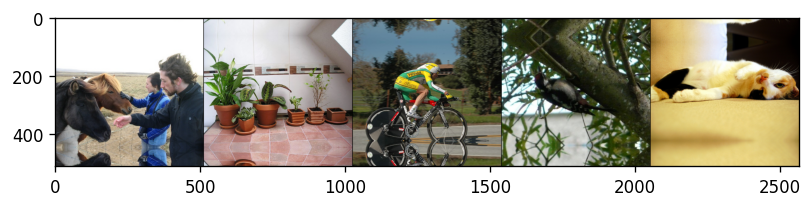

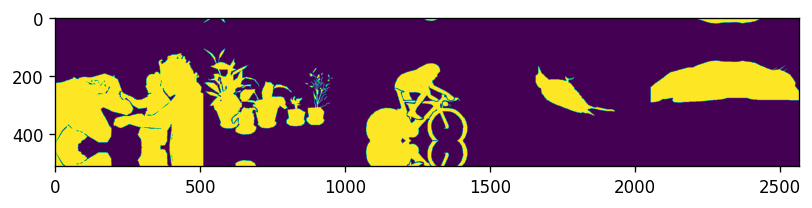

In [ ]:
def show_dataset(dataset):
    images = []
    masks = []
    for _ in range(5):
        i = random.randint(0, len(valset) - 1)
        if len(images):
            separator = np.zeros((dataset.image_size[0], 2, 3), dtype=np.uint8)
            images.append(separator)
            masks.append(separator[:, :, 0])
        image, mask = dataset[i]
        images.append(cvmade.image.image_to_numpy(image))
        masks.append(cvmade.image.image_to_numpy(mask[None, ...])[..., 0])

    %matplotlib inline
    set_figure_size()
    plt.imshow(np.concatenate(images, axis=1))
    plt.show()
    set_figure_size()
    plt.imshow(np.concatenate(masks, axis=1))
    plt.show()

valset.set_padding(0)
show_dataset(trainset)

## **Pyramid Scene Parsing Network**

In [ ]:
psp = smp.PSPNet("inceptionresnetv2", encoder_weights=None, classes=NUM_CLASSES if NUM_CLASSES > 2 else 1)

psp.eval()
sample_input = torch.zeros((1, 3, 1024, 1024))
if USE_CUDA:
    sample_input = sample_input.cuda()
    psp.cuda()
with torch.no_grad():
    sample_output = psp(sample_input)
pretrained_padding = (sample_input.shape[-1] - sample_output.shape[-1]) // 2
print(psp)
print("Padding", pretrained_padding)

PSPNet(
  (encoder): InceptionResNetV2Encoder(
    (conv2d_1a): BasicConv2d(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (conv2d_2a): BasicConv2d(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (conv2d_2b): BasicConv2d(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (maxpool_3a): MaxPool2d(kernel_size=3, stride=2, padding=(1, 1), dilation=1, ceil_mode=False)
    (conv2d_3b): BasicConv2d(
      (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(80,

In [ ]:
trainset.set_padding(pretrained_padding)
valset.set_padding(pretrained_padding)

In [ ]:
def crop_images(predicted, masks_or_images):
    """Если выход больше или меньше чем исходное изображение,
    вырезать центральную часть из обоих, чтобы размеры совпадали.
    """
    if len(masks_or_images.shape) == 3:
        predicted, masks = crop_images(predicted, masks_or_images.unsqueeze(1))
        return predicted, masks[:, 0]
    images = masks_or_images
    if (len(predicted.shape) != 4) or (len(images.shape) != 4):
        raise ValueError("Expected tensors of shape BCHW")
    bi, ci, hi, wi = images.shape
    bp, cp, hp, wp = predicted.shape
    offset = (abs(hi - hp) // 2, abs(wi - wp) // 2)
    if hp < hi:
        images = images[:, :, offset[0]:offset[0] + hp]
    else:
        predicted = predicted[:, :, offset[0]:offset[0] + hi]
    if wp < wi:
        images = images[:, :, :, offset[1]:offset[1] + wp]
    else:
        predicted = predicted[:, :, :, offset[1]:offset[1] + wi]
    return predicted, images

In [ ]:
def show_segmentations(model, dataset, n=5):
    model.eval()
    if USE_CUDA:
        model.cuda()
    for _ in range(n):
        image, mask_gt = dataset[random.randint(0, len(dataset) - 1)]
        if USE_CUDA:
            image = image.cuda()
            mask_gt = mask_gt.cuda()
        with torch.no_grad():
            predicted = model(image.unsqueeze(0))[0]  # CHW.
            predicted, image = crop_images(predicted.unsqueeze(0), image.unsqueeze(0))
            predicted, image = predicted[0], image[0]
            c = predicted.shape[0]
            if c == 1:
                predicted = torch.nn.functional.logsigmoid(predicted)
                aggregated = predicted[0]
                predicted_labels = predicted[0] > np.log(0.5)
            else:
                predicted = torch.nn.functional.log_softmax(predicted, 0)
                aggregated = torch.logsumexp(predicted[1:], axis=0)
                predicted_labels = predicted.max(0)[1]
        aggregated = aggregated.cpu().numpy()
        predicted_labels = predicted_labels.cpu().numpy().astype(np.uint8)
        image = cvmade.image.image_to_numpy(image)
        mask = (predicted_labels > 0)[..., None]
        selected = image * mask + 255 * (1 - mask)

        %matplotlib inline
        if c != 1:
            print("Classes:", [LABELS[i] for i in set(predicted_labels.flatten().tolist())])
        set_figure_size()
        fig, axs = plt.subplots(1, 4, figsize=(12, 6))
        axs[0].imshow(image)
        axs[1].imshow(predicted_labels)
        axs[2].imshow(aggregated)
        axs[3].imshow(selected)
        plt.show()

Trainset


<Figure size 960x720 with 0 Axes>

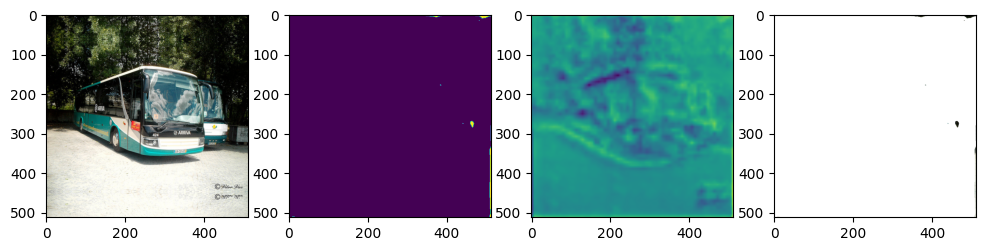

<Figure size 960x720 with 0 Axes>

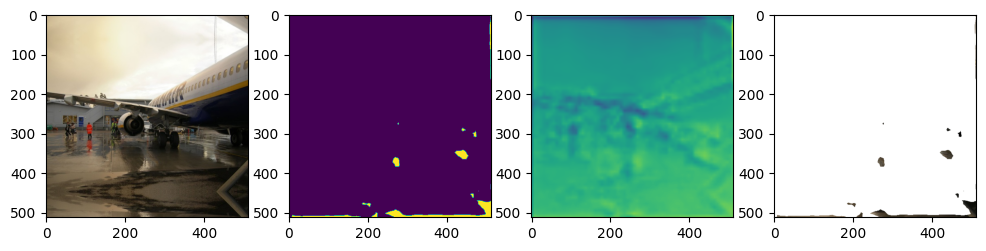

<Figure size 960x720 with 0 Axes>

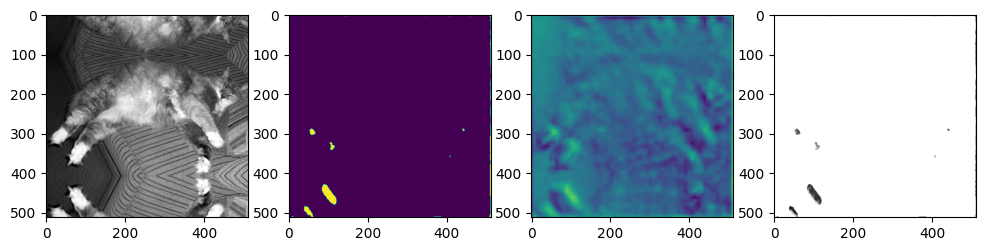

<Figure size 960x720 with 0 Axes>

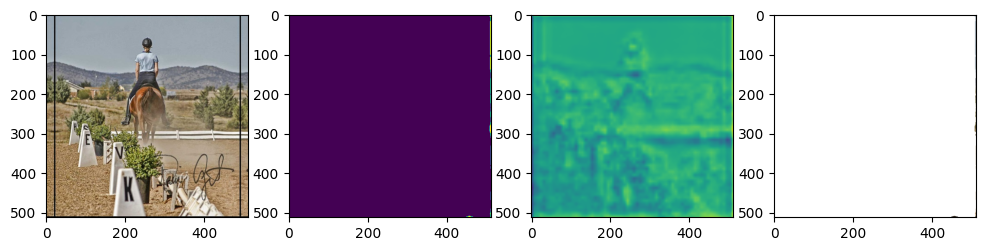

<Figure size 960x720 with 0 Axes>

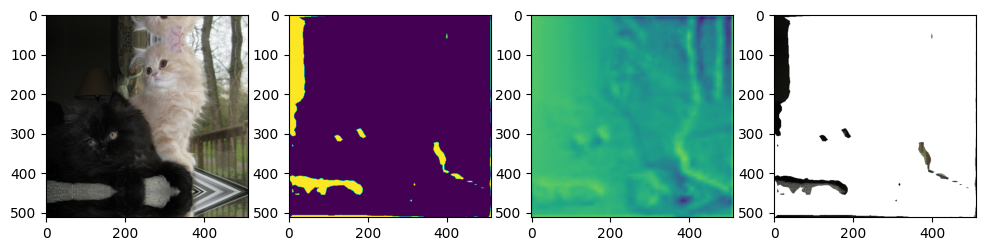

Valset


<Figure size 960x720 with 0 Axes>

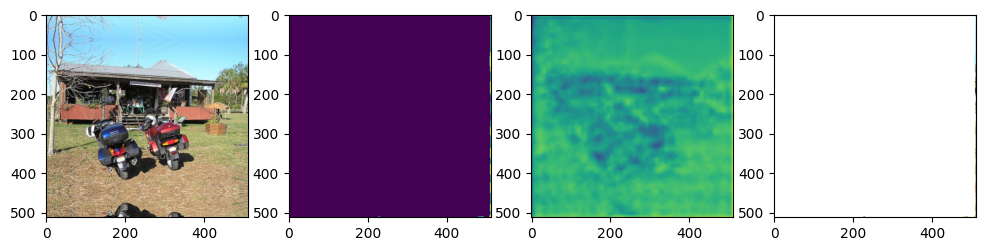

<Figure size 960x720 with 0 Axes>

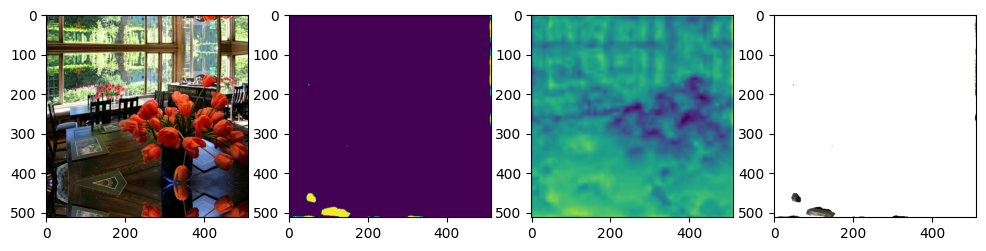

<Figure size 960x720 with 0 Axes>

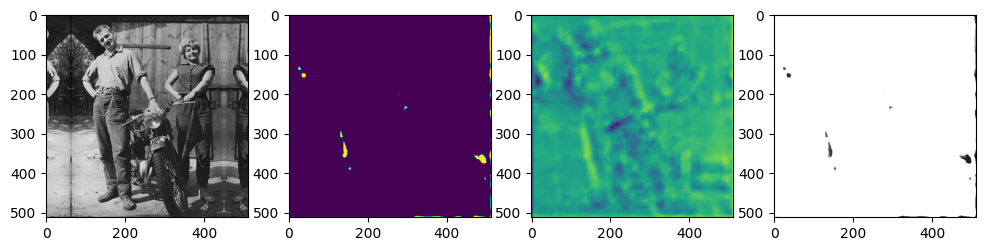

<Figure size 960x720 with 0 Axes>

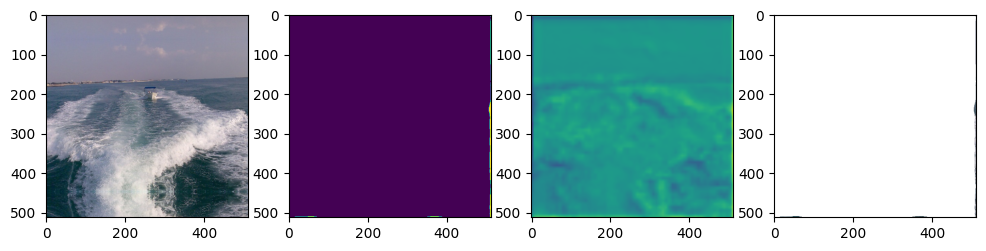

<Figure size 960x720 with 0 Axes>

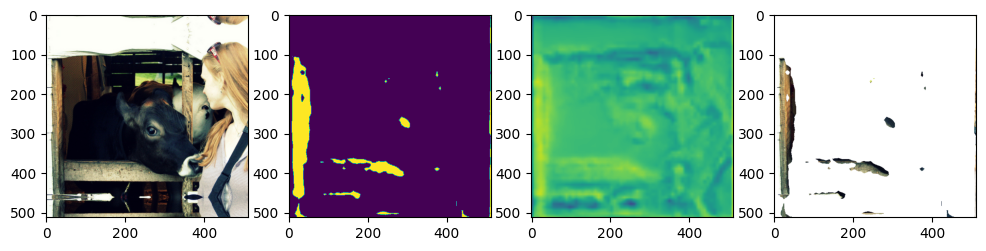

In [ ]:
print("Trainset")
show_segmentations(psp, trainset)

print("Valset")
show_segmentations(psp, valset)

In [ ]:
class BCELoss(torch.nn.Module):
    def __init__(self):
        super().__init__()

        # Ваш код здесь.

        self._bce = torch.nn.BCEWithLogitsLoss()

        # Конец вашего кода.

    def __call__(self, predicted, masks):
        predicted, masks = crop_images(predicted, masks)
        b, c, h, w = predicted.shape
        if c != 1:
            raise ValueError("{} не подходит для многоклассовой классификации".format(type(self)))

        # predicted: float32, BCHW.
        # masks: long, BHW.

        # Ваш код здесь.

        loss = self._bce(predicted.squeeze(1), masks.float())

        # Конец вашего кода.

        return loss

seminar.check_bce_loss(BCELoss)
seminar.check_ok()

CHECK OK


In [ ]:
class XentLoss(torch.nn.Module):
    """Функция потерь для сегментации с несколькими классами."""
    def __init__(self):
        super().__init__()
        self._xent = torch.nn.CrossEntropyLoss()

    def __call__(self, predicted, masks):
        predicted, masks = crop_images(predicted, masks)
        b, c, h, w = predicted.shape
        if c == 1:
            raise ValueError("{} не подходит для бинарной классификации".format(type(self)))
        predicted = predicted.permute(0, 2, 3, 1).reshape(b * h * w, c)
        masks = masks.reshape(-1)
        loss = self._xent(predicted, masks)
        return loss

In [ ]:
def make_optimizer(model):
    return torch.optim.Adam(model.parameters(), lr=1e-4)

In [32]:
loss_fn = BCELoss if NUM_CLASSES == 2 else XentLoss

if TRAIN:
    trainset.set_padding(pretrained_padding)
    valset.set_padding(pretrained_padding)
    seminar.train_model(psp, loss_fn, make_optimizer, trainset, valset,
                        lr_scheduler_fn=lambda opt: None,
                        eval_steps=500,
                        batch_size=4,
                        num_epochs=50)
else:
    psp.load_state_dict(torch.load("checkpoint-pretrained.pth.tar", map_location=DEVICE))
    cvmade.plot.show_image("resources/02-pretrained.jpg")

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type    | Params
---------------------------------------
0 | _model     | PSPNet  | 54.7 M
1 | _criterion | BCELoss | 0     
---------------------------------------
54.7 M    Trainable params
0         Non-trainable params
54.7 M    Total params
218.971   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


In [331]:
%load_ext tensorboard
%tensorboard --logdir ./lightning_logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [332]:
from google.colab import output
output.serve_kernel_port_as_window(6006, path="")

<IPython.core.display.Javascript object>

Trainset


<Figure size 960x720 with 0 Axes>

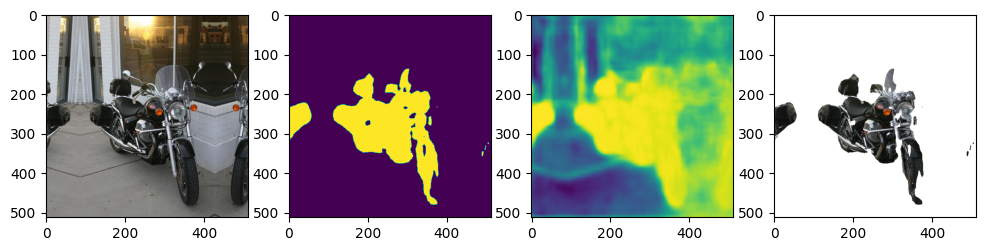

<Figure size 960x720 with 0 Axes>

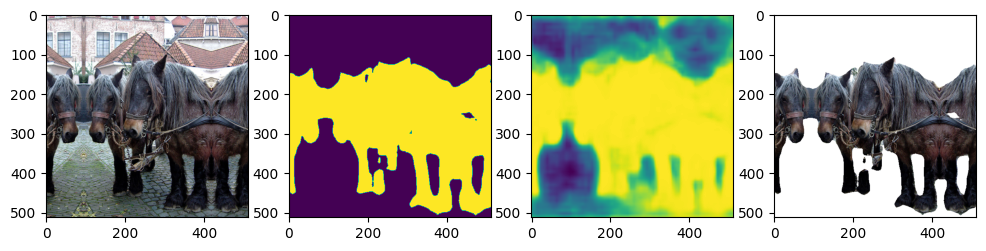

<Figure size 960x720 with 0 Axes>

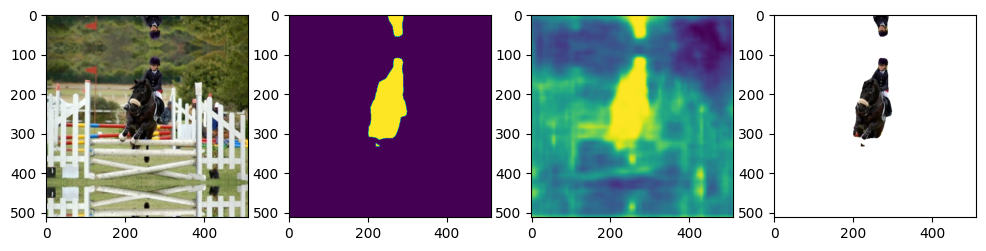

<Figure size 960x720 with 0 Axes>

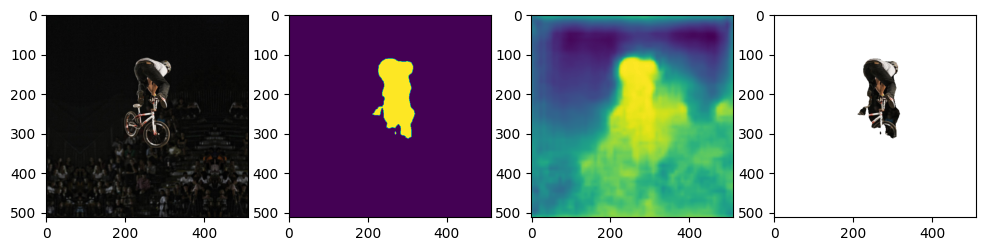

<Figure size 960x720 with 0 Axes>

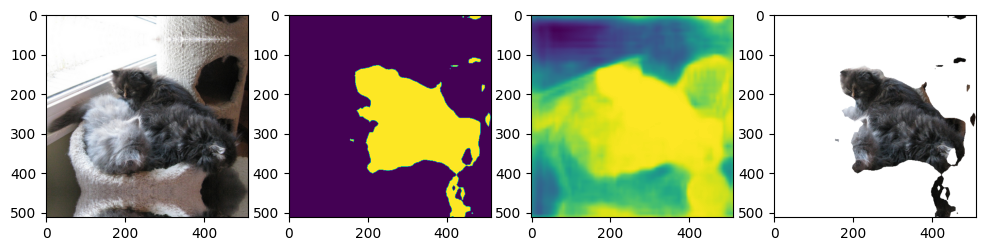

Valset


<Figure size 960x720 with 0 Axes>

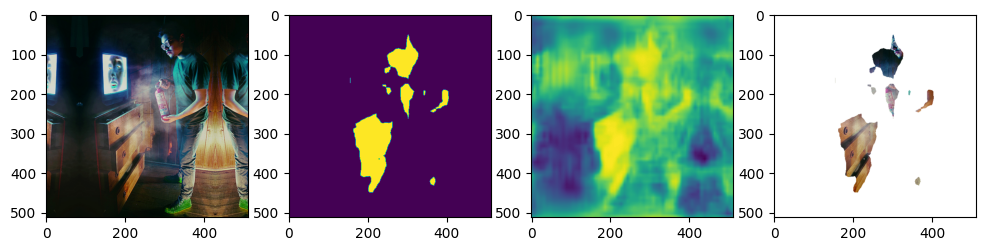

<Figure size 960x720 with 0 Axes>

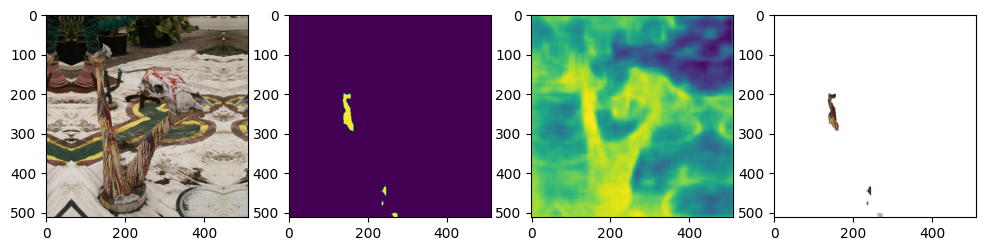

<Figure size 960x720 with 0 Axes>

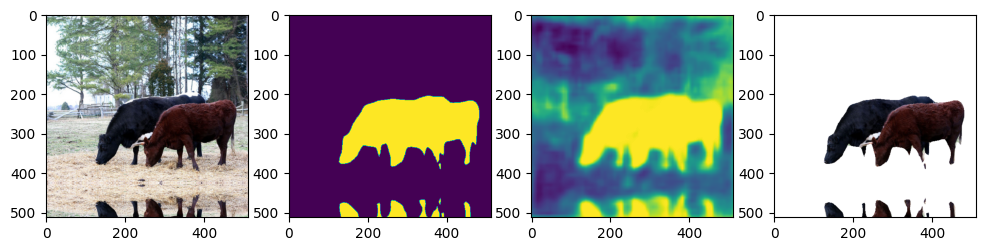

<Figure size 960x720 with 0 Axes>

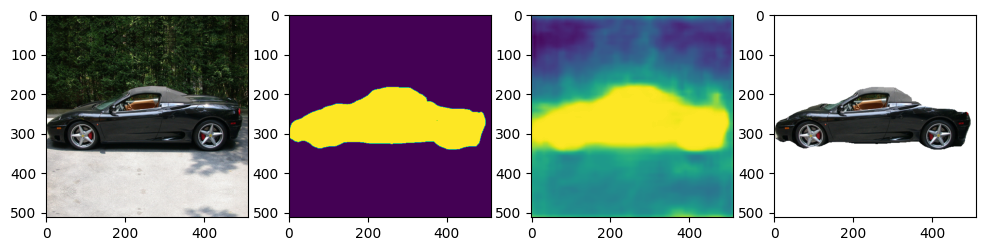

<Figure size 960x720 with 0 Axes>

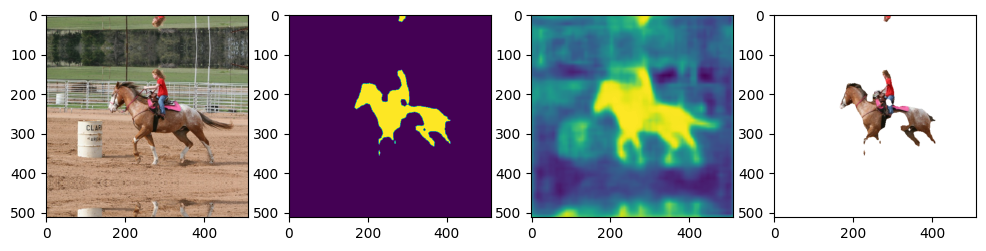

In [33]:
print("Trainset")
show_segmentations(psp, trainset)

print("Valset")
show_segmentations(psp, valset)

In [57]:
import random
import numpy as np
import torch
import torchvision
import pytorch_lightning as pl
from torchvision.datasets import CIFAR10

import cvmade


class Module(pl.LightningModule):
    def __init__(self, model, loss_fn, optimizer_fn, trainset, testset,
                 lr_scheduler_fn=None,
                 batch_size=16):
        super().__init__()
        self._model = model
        self._optimizer_fn = optimizer_fn
        self._lr_scheduler_fn = lr_scheduler_fn
        self._criterion = loss_fn()
        self._batch_size = batch_size
        self._trainset = trainset
        self._testset = testset

    def forward(self, input):
        return self._model(input)

    def calculate_iou(self, predicted, target):
        predicted = predicted.to(torch.long)
        target = target.to(torch.long)

        intersection = (predicted & target).sum().item()
        union = (predicted | target).sum().item()
        iou = intersection / union
        return iou

    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self._model(x)
        loss = self._criterion(logits, y)

        predicted_masks = (logits > 0.5).float()
        iou = self.calculate_iou(predicted_masks, y)

        self.logger.experiment.add_scalars("loss",
                                           {"train": loss},
                                           global_step=self.global_step)
        self.logger.experiment.add_scalars("iou",
                                           {"train": iou},
                                           global_step=self.global_step)
        return loss


    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self._model(x)
        loss = self._criterion(logits, y)
        predicted_masks = (logits > 0.5).float()
        iou = self.calculate_iou(predicted_masks, y)

        self.logger.experiment.add_scalars("loss",
                                           {"val": loss},
                                           global_step=self.global_step)
        self.logger.experiment.add_scalars("iou",
                                           {"val": iou},
                                           global_step=self.global_step)

    def train_dataloader(self):
        return torch.utils.data.DataLoader(self._trainset, batch_size=self._batch_size, shuffle=True, drop_last=True, num_workers=2)

    def val_dataloader(self):
        return torch.utils.data.DataLoader(self._testset, batch_size=self._batch_size, shuffle=False, num_workers=2)

    def configure_optimizers(self):
        optimizer = self._optimizer_fn(self._model)
        scheduler = self._lr_scheduler_fn(optimizer)
        if scheduler:
            return [optimizer], [scheduler]
        else:
            return optimizer


def train_model(model, loss_fn, optimizer_fn, trainset, testset,
                lr_scheduler_fn=None,
                batch_size=4,
                eval_steps=250,
                num_epochs=1):
    model = Module(model, loss_fn, optimizer_fn, trainset, testset,
                   lr_scheduler_fn, batch_size)
    trainer = pl.Trainer(accelerator='auto', max_epochs=num_epochs, val_check_interval=eval_steps)
    trainer.fit(model)



In [59]:
import torch.nn.functional as F

In [60]:
class DiceLoss(torch.nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):


        inputs = F.sigmoid(inputs)

        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)

        return 1 - dice

In [62]:
class DiceBCELoss(torch.nn.Module):
    def __init__(self, alpha=0.7):
        super().__init__()

        # Ваш код здесь.

        self._bce = torch.nn.BCEWithLogitsLoss()
        self._dice = DiceLoss()
        self.alpha = alpha
        # Конец вашего кода.

    def __call__(self, predicted, masks):
        predicted, masks = crop_images(predicted, masks)
        b, c, h, w = predicted.shape
        if c != 1:
            raise ValueError("{} не подходит для многоклассовой классификации".format(type(self)))

        combined_loss = (1 - self.alpha)*self._bce(predicted.squeeze(1), masks.float()) + self.alpha * self._dice(predicted.squeeze(1), masks.float())

        return combined_loss

In [63]:
augment = (
    AffineAugmenter(),
    BrightnessContrastAugmenter(),
    BlurAugmenter(),
    FlipAugmenter(),
)


In [64]:
trainset = VOCDataset(DATA_ROOT, VOC_YEAR, (IMAGE_SIZE, IMAGE_SIZE),
                      multiclass=MULTICLASS, train=True, augment=True, augmentations=augment)
valset = VOCDataset(DATA_ROOT, VOC_YEAR, (IMAGE_SIZE, IMAGE_SIZE),
                    multiclass=MULTICLASS, train=False)
print("Image size:", IMAGE_SIZE)
print("Train set size:", len(trainset))
print("Validation set size:", len(valset))

Image size: 512
Train set size: 2330
Validation set size: 583


Trainset


<Figure size 960x720 with 0 Axes>

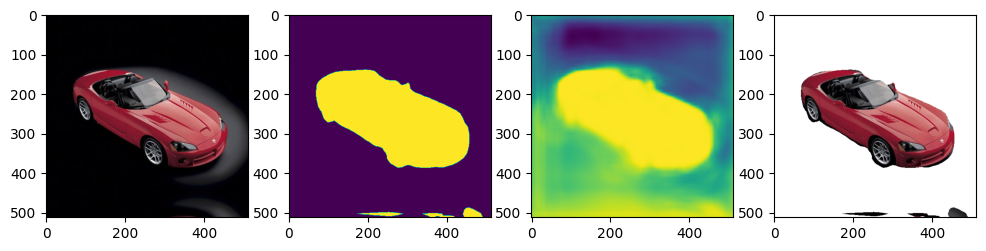

<Figure size 960x720 with 0 Axes>

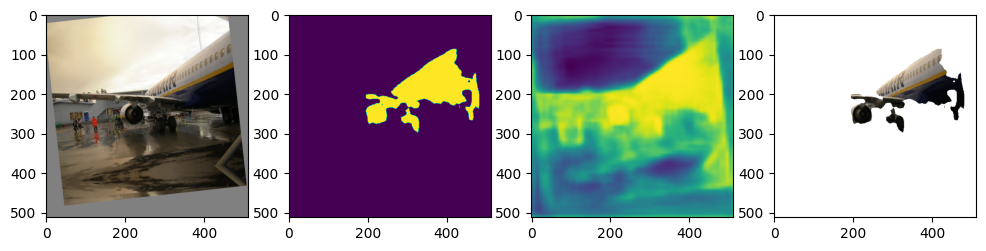

<Figure size 960x720 with 0 Axes>

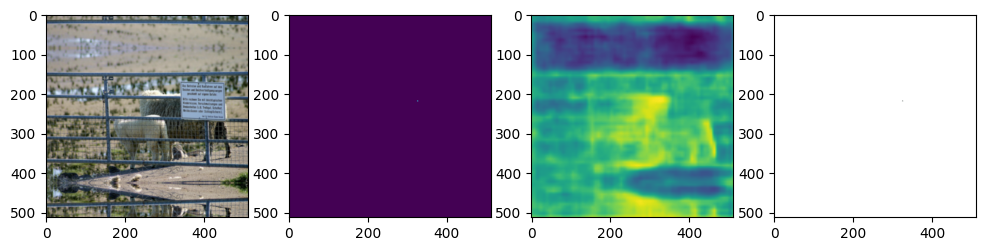

<Figure size 960x720 with 0 Axes>

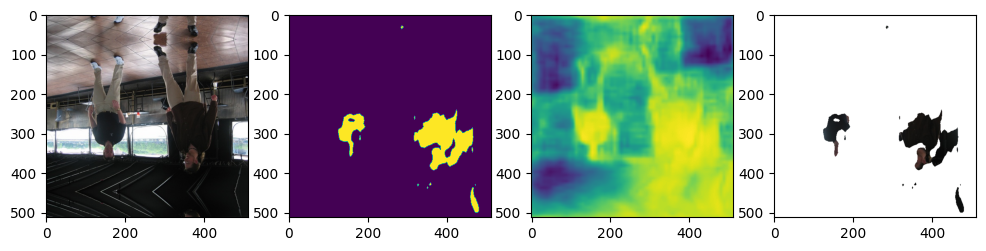

<Figure size 960x720 with 0 Axes>

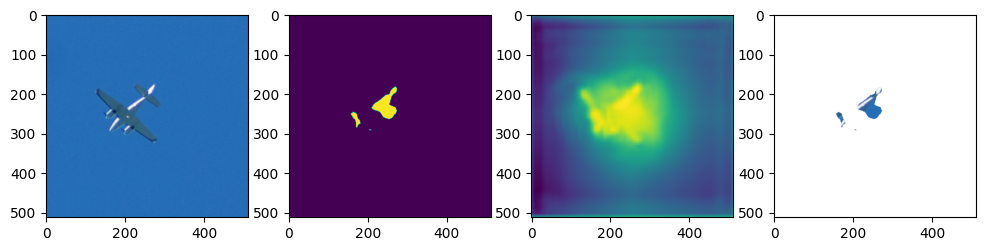

Valset


<Figure size 960x720 with 0 Axes>

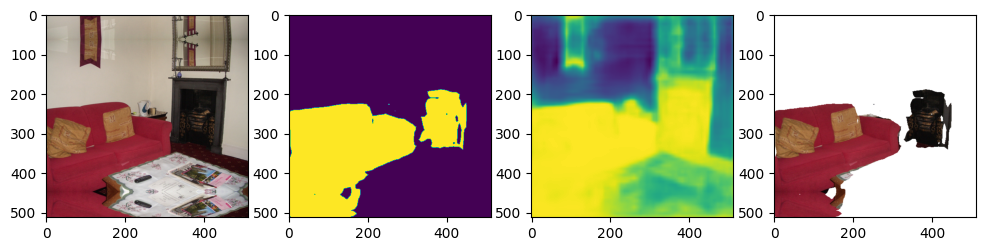

<Figure size 960x720 with 0 Axes>

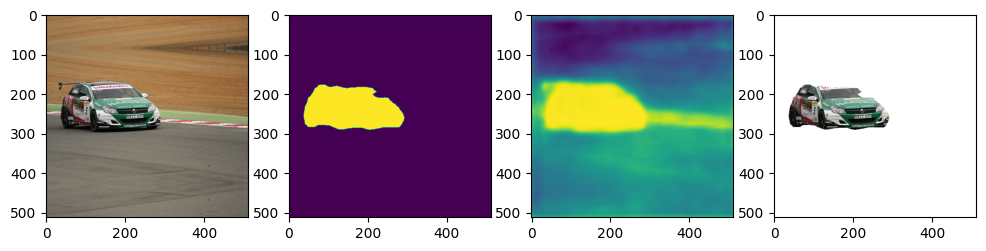

<Figure size 960x720 with 0 Axes>

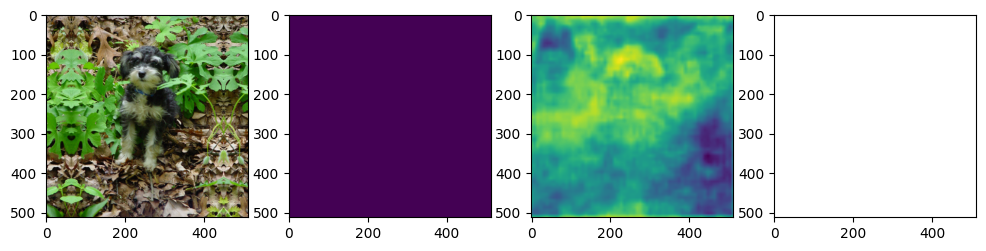

<Figure size 960x720 with 0 Axes>

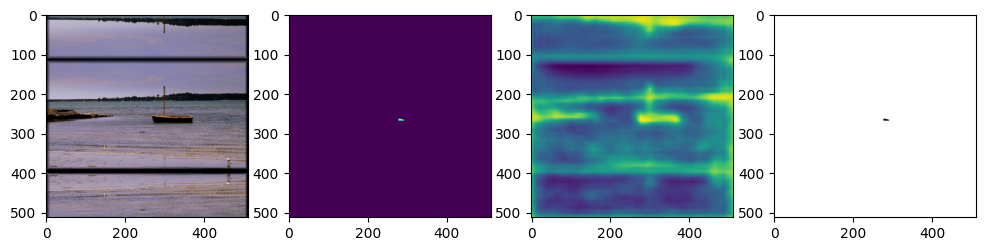

<Figure size 960x720 with 0 Axes>

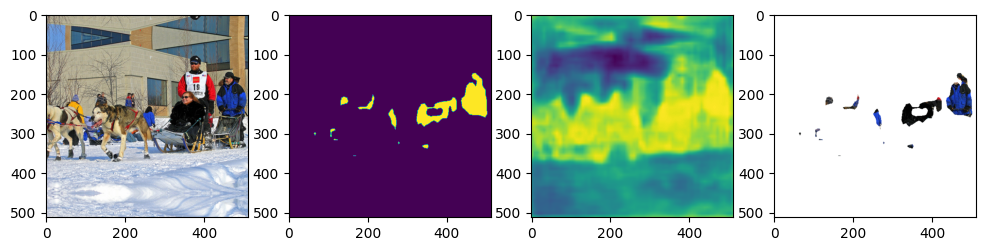

In [48]:
print("Trainset")
show_segmentations(psp, trainset)

print("Valset")
show_segmentations(psp, valset)

In [65]:
loss_fn = DiceBCELoss if NUM_CLASSES == 2 else XentLoss

if TRAIN:
    trainset.set_padding(pretrained_padding)
    valset.set_padding(pretrained_padding)
    train_model(psp, loss_fn, make_optimizer, trainset, valset,
                        lr_scheduler_fn=lambda opt: None,
                        eval_steps=500,
                        batch_size=4,
                        num_epochs=5)
else:
    psp.load_state_dict(torch.load("checkpoint-pretrained.pth.tar", map_location=DEVICE))
    cvmade.plot.show_image("resources/02-pretrained.jpg")

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type        | Params
-------------------------------------------
0 | _model     | PSPNet      | 54.7 M
1 | _criterion | DiceBCELoss | 0     
-------------------------------------------
54.7 M    Trainable params
0         Non-trainable params
54.7 M    Total params
218.971   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=5` reached.


**ЛОСС ПАДАЕТ**

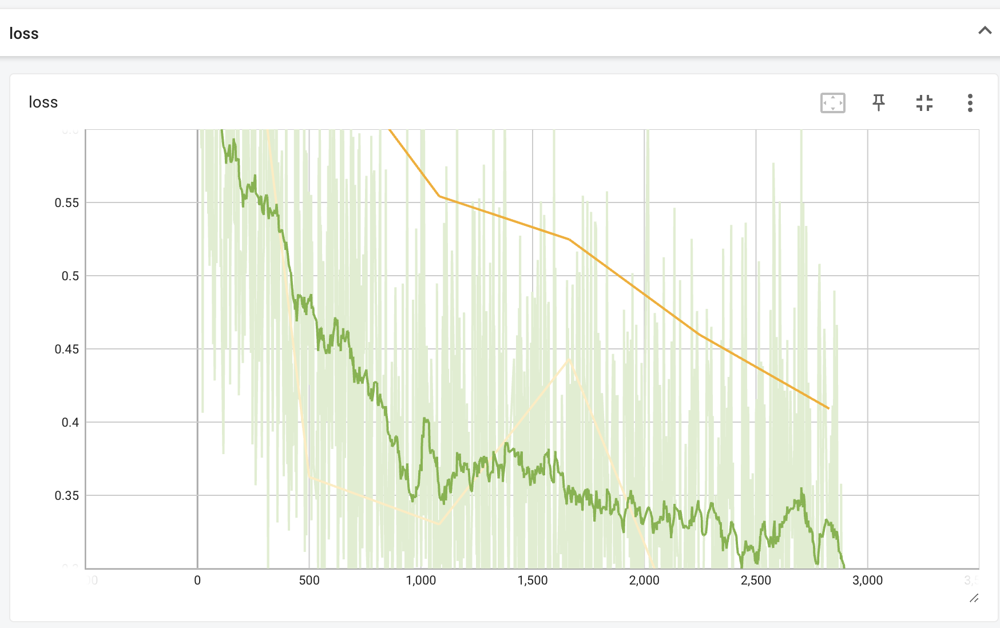

## **IoU растёт**

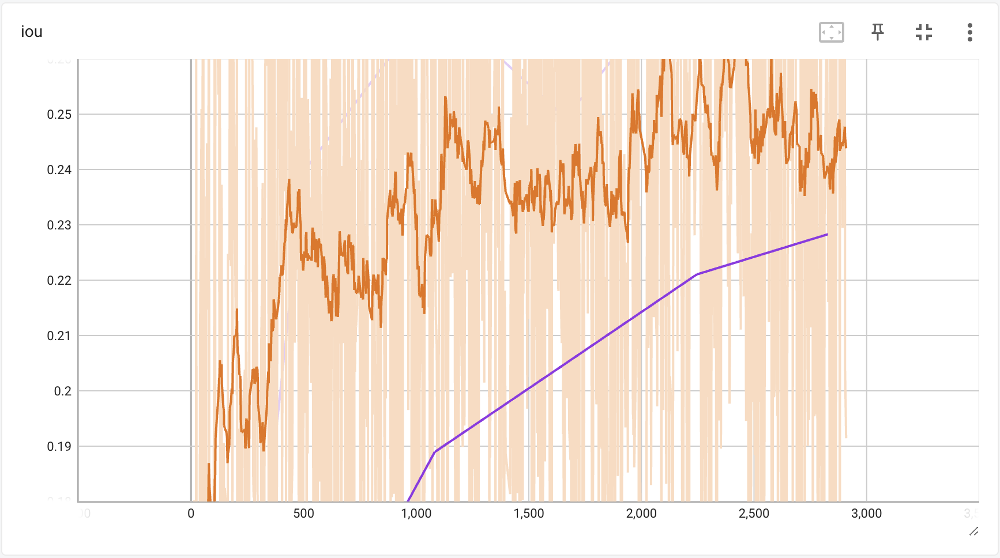

Trainset


<Figure size 960x720 with 0 Axes>

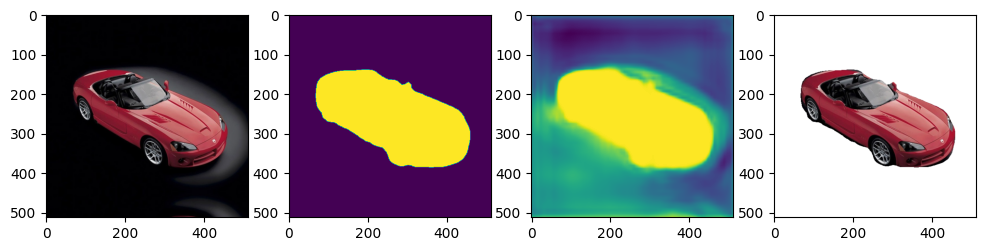

<Figure size 960x720 with 0 Axes>

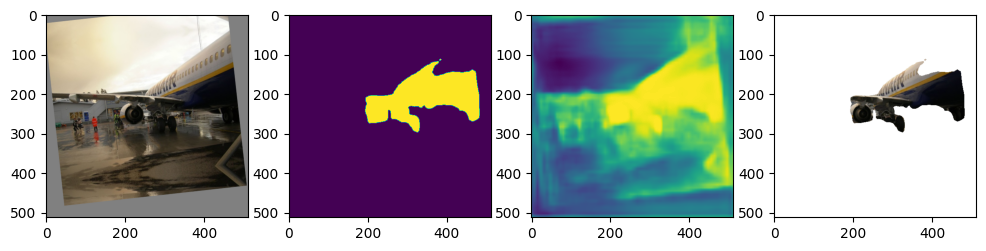

<Figure size 960x720 with 0 Axes>

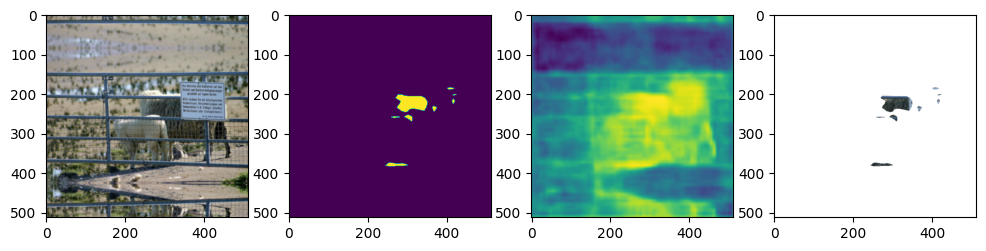

<Figure size 960x720 with 0 Axes>

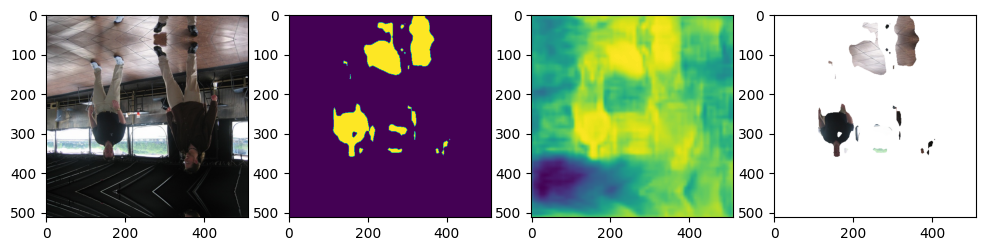

<Figure size 960x720 with 0 Axes>

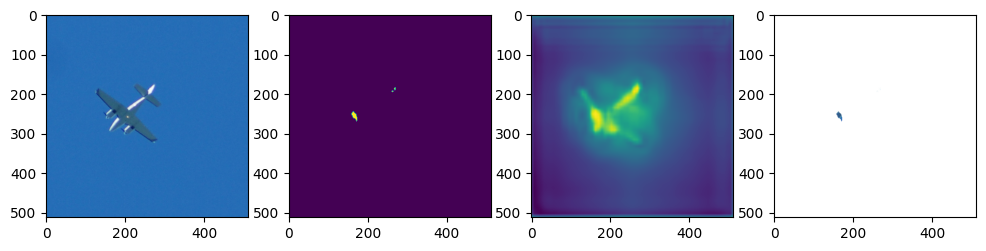

Valset


<Figure size 960x720 with 0 Axes>

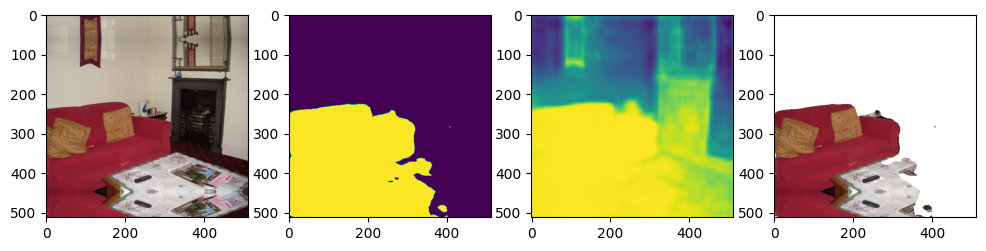

<Figure size 960x720 with 0 Axes>

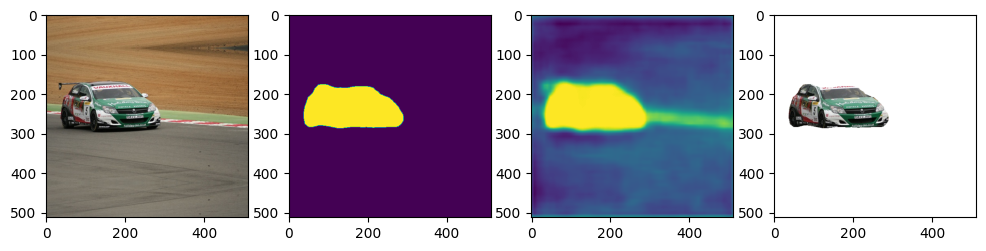

<Figure size 960x720 with 0 Axes>

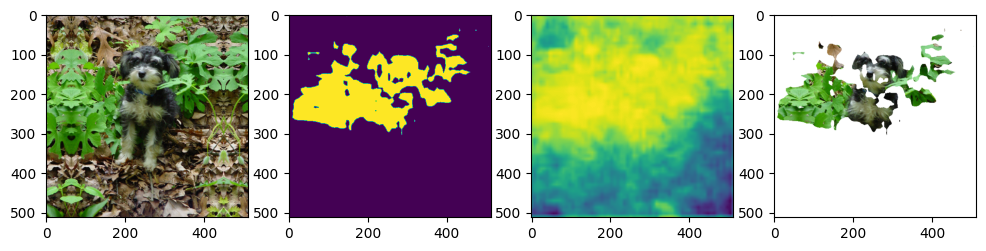

<Figure size 960x720 with 0 Axes>

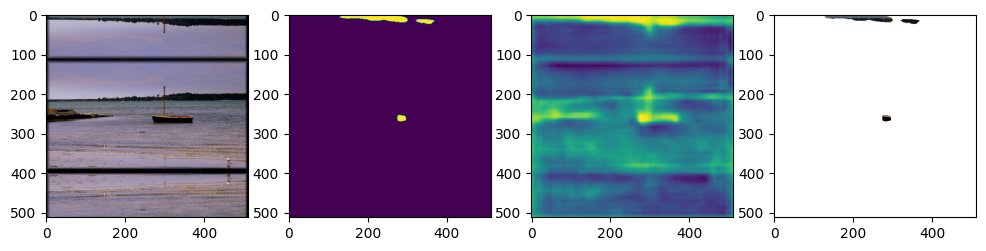

<Figure size 960x720 with 0 Axes>

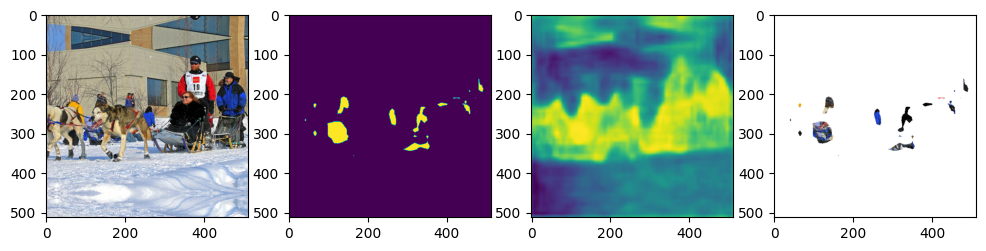

In [69]:
print("Trainset")
show_segmentations(psp, trainset)

print("Valset")
show_segmentations(psp, valset)

**Собачка потихоньку вырисовывается)))**

### **Добавим аугментации** ✈

In [323]:
class SaturationAugmenter(object):
    def __init__(self, saturation_range=(0.5, 2.0)):
        self.saturation_range = saturation_range

    def __call__(self, image, mask):
        hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        saturation_factor = np.random.uniform(*self.saturation_range)
        hsv_image[:, :, 1] = np.clip(hsv_image[:, :, 1] * saturation_factor, 0, 255)
        adjusted_image = cv2.cvtColor(hsv_image, cv2.COLOR_HSV2BGR)

        return adjusted_image, mask

In [324]:
class BrightnessContrastAugmenter(object):
    def __init__(self, brightness_range=(0.5, 2.0), contrast_range=(0.5, 2.0)):
        self.brightness_range = brightness_range
        self.contrast_range = contrast_range

    def __call__(self, image, mask):
        alpha = np.random.uniform(*self.contrast_range)
        beta = np.random.uniform(*self.brightness_range)
        adjusted_image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)

        return adjusted_image, mask

In [325]:
add_augment = (
    AffineAugmenter(),
    BrightnessContrastAugmenter(),
    BlurAugmenter(),
    FlipAugmenter(),
    BrightnessContrastAugmenter(),
    SaturationAugmenter(),
)

In [326]:
trainset = VOCDataset(DATA_ROOT, VOC_YEAR, (IMAGE_SIZE, IMAGE_SIZE),
                      multiclass=MULTICLASS, train=True, augment=True, augmentations=add_augment)
valset = VOCDataset(DATA_ROOT, VOC_YEAR, (IMAGE_SIZE, IMAGE_SIZE),
                    multiclass=MULTICLASS, train=False)
print("Image size:", IMAGE_SIZE)
print("Train set size:", len(trainset))
print("Validation set size:", len(valset))

Image size: 512
Train set size: 2330
Validation set size: 583


Trainset


<Figure size 960x720 with 0 Axes>

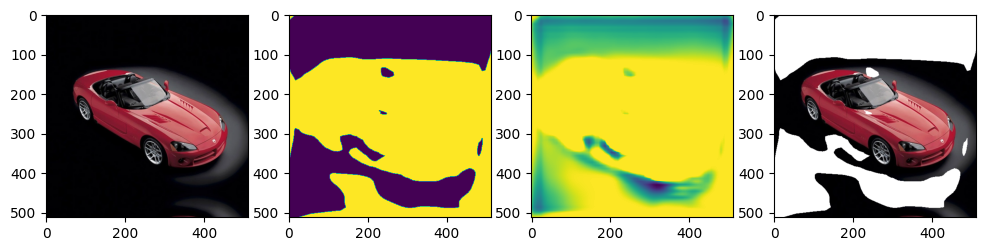

<Figure size 960x720 with 0 Axes>

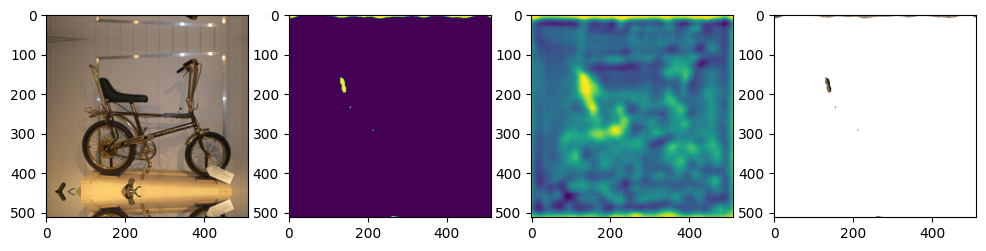

<Figure size 960x720 with 0 Axes>

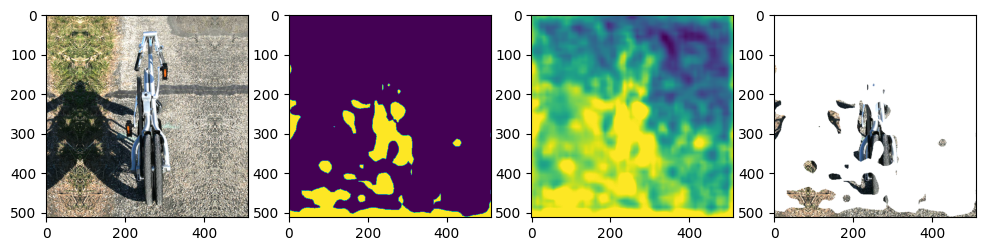

<Figure size 960x720 with 0 Axes>

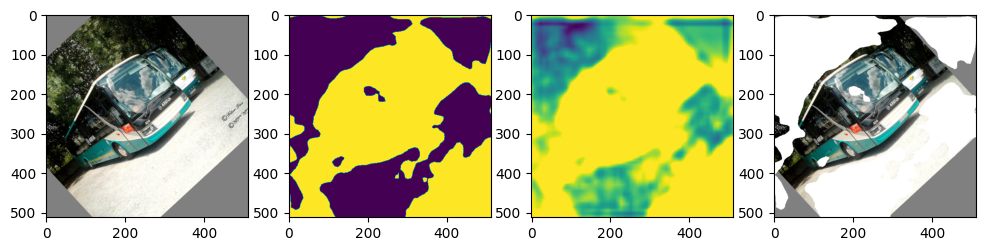

<Figure size 960x720 with 0 Axes>

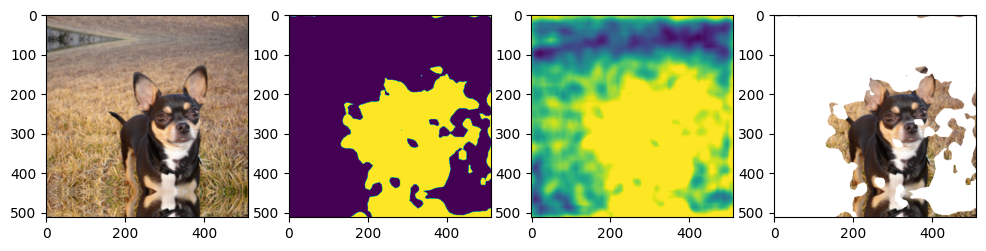

In [327]:
print("Trainset")
show_segmentations(psp, trainset)

Тут видно что добавлен кроп и мб яркость)

In [329]:
loss_fn = DiceBCELoss if NUM_CLASSES == 2 else XentLoss

if TRAIN:
    trainset.set_padding(pretrained_padding)
    valset.set_padding(pretrained_padding)
    train_model(psp, loss_fn, make_optimizer, trainset, valset,
                        lr_scheduler_fn=lambda opt: None,
                        eval_steps=500,
                        batch_size=4,
                        num_epochs=15)
else:
    psp.load_state_dict(torch.load("checkpoint-pretrained.pth.tar", map_location=DEVICE))
    cvmade.plot.show_image("resources/02-pretrained.jpg")

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name       | Type        | Params
-------------------------------------------
0 | _model     | PSPNet      | 54.7 M
1 | _criterion | DiceBCELoss | 0     
-------------------------------------------
54.7 M    Trainable params
0         Non-trainable params
54.7 M    Total params
218.971   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.


Trainset


<Figure size 960x720 with 0 Axes>

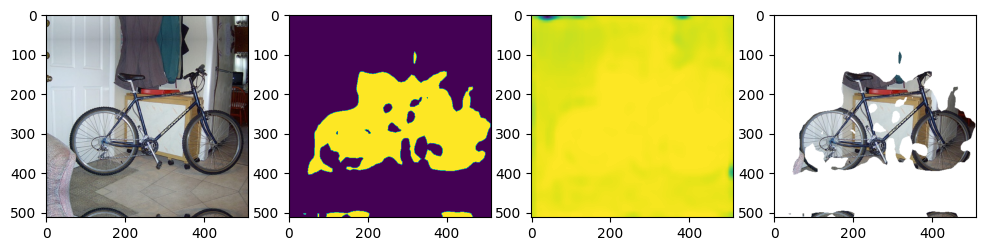

<Figure size 960x720 with 0 Axes>

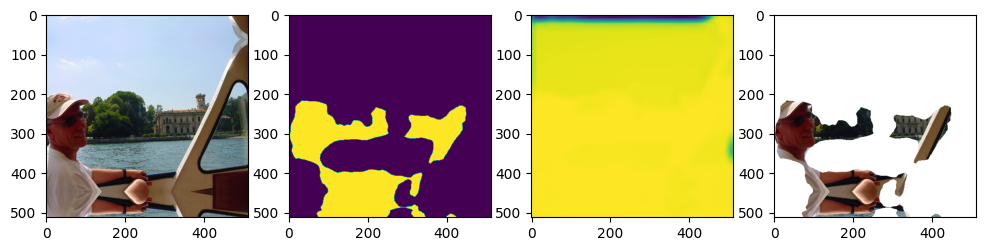

<Figure size 960x720 with 0 Axes>

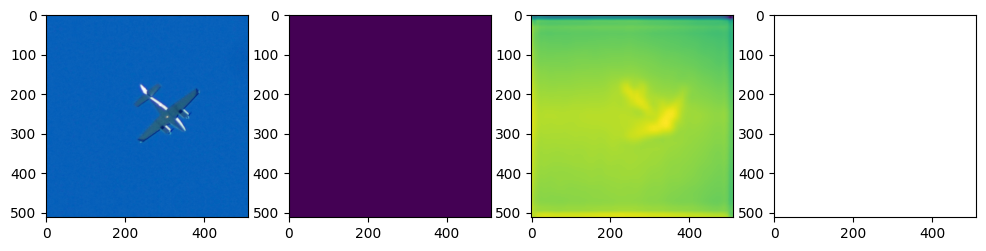

<Figure size 960x720 with 0 Axes>

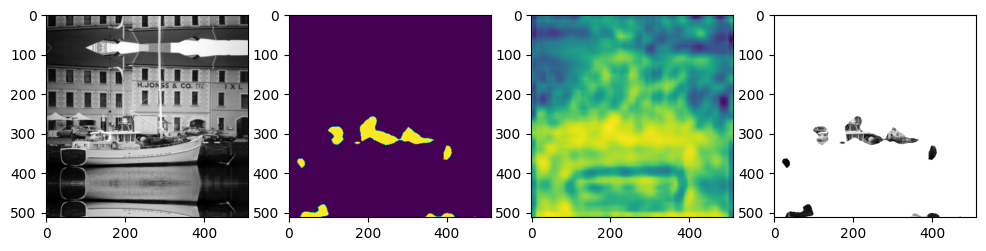

<Figure size 960x720 with 0 Axes>

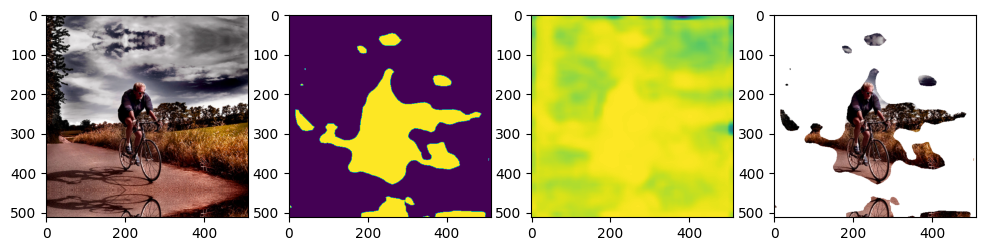

Valset


<Figure size 960x720 with 0 Axes>

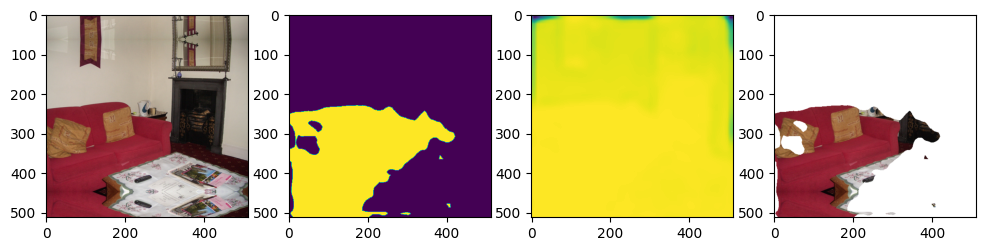

<Figure size 960x720 with 0 Axes>

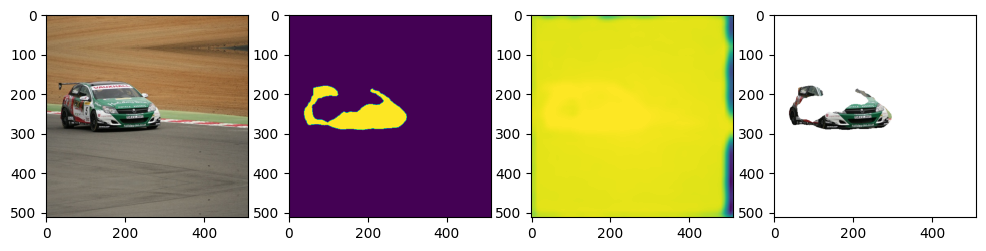

<Figure size 960x720 with 0 Axes>

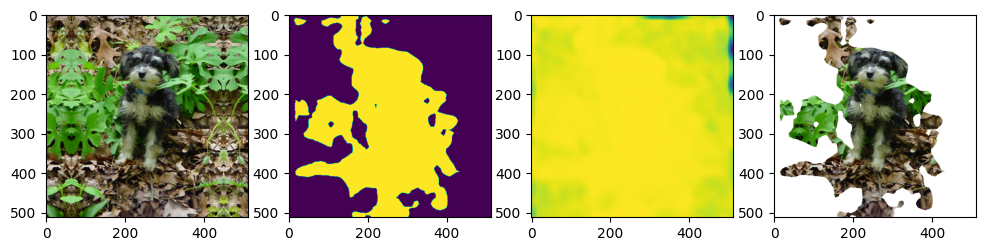

<Figure size 960x720 with 0 Axes>

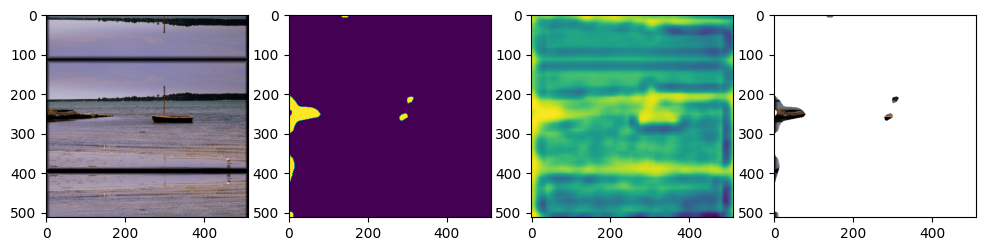

<Figure size 960x720 with 0 Axes>

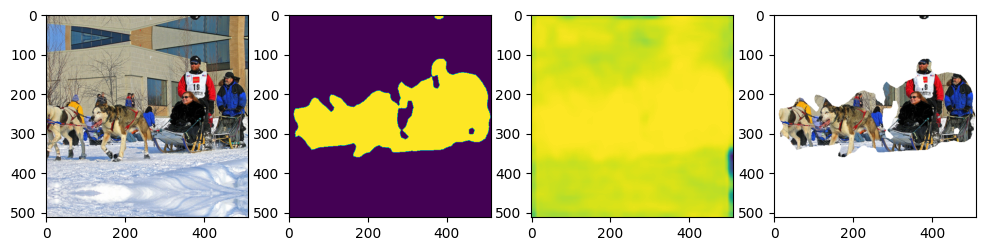

In [330]:
print("Trainset")
show_segmentations(psp, trainset)

print("Valset")
show_segmentations(psp, valset)

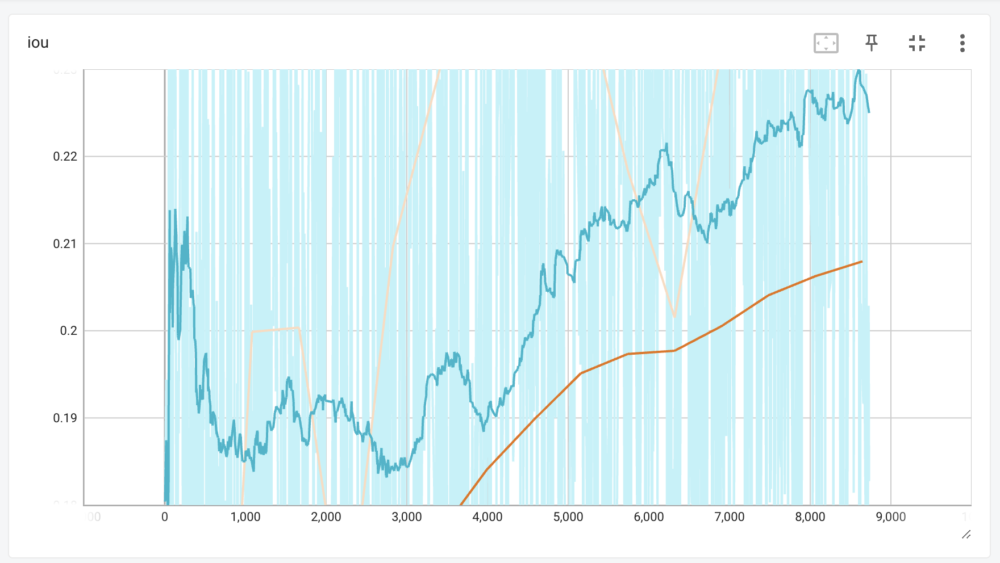

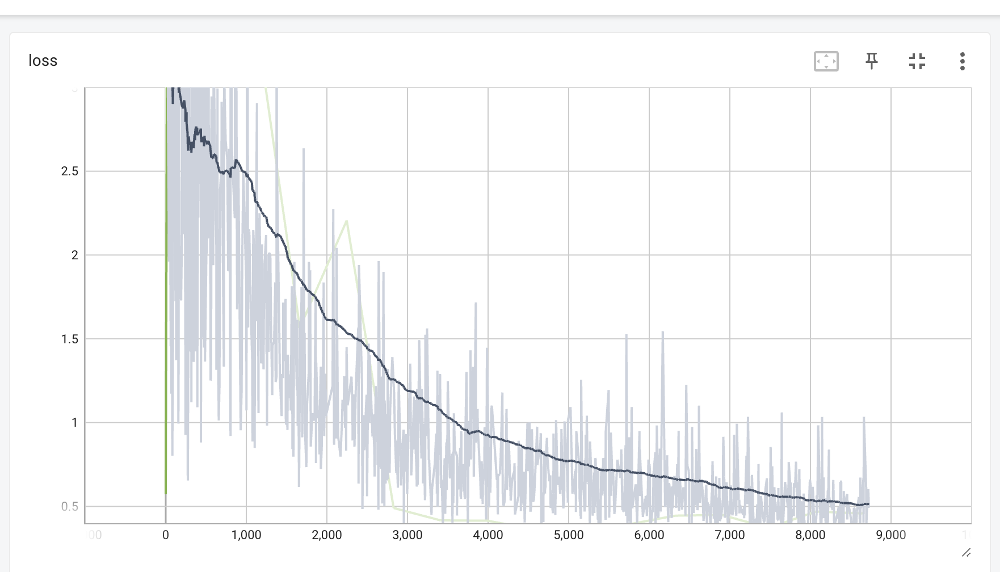

У меня кончилось время на GPU поэтому сделаю выводы сейчас(

Результаты стали хуже на валидации, наверное, потому что появлось больше аугментаций, возможно если учить больше эпох результаты будут лучше, по значениям график видно что лосс на валидации падает и IoU растёт